In [75]:
%load_ext autoreload
%autoreload
from data import *
from audio_diffusion import *
import tensorflow_io as tfio
import tensorflow as tf
import glob
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

model_base = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(model_base, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [170]:
model_path = '/sddata/finetune/lora/MDCT1ktest/'

pipe.unet.load_attn_procs(model_path)
pipe.to("cuda")

prompt = "electronic pop song with fast drums"
filename = "examples/electronic_pop.png"

image = pipe(
    prompt,
    num_inference_steps=20,
    guidance_scale=7,
    cross_attention_kwargs={"scale": 1},
).images[0]

image.save(filename)

  0%|          | 0/20 [00:00<?, ?it/s]

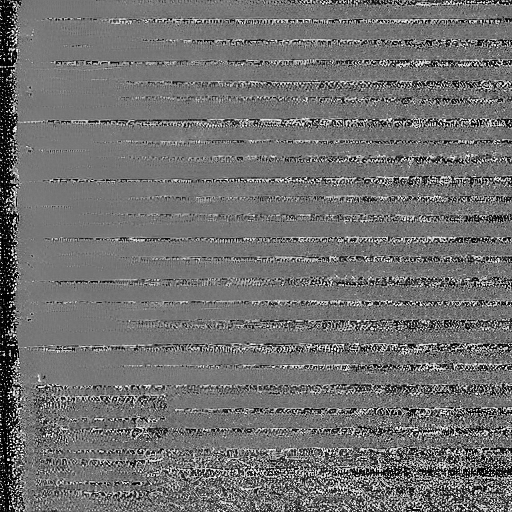

In [180]:
bits = tf.io.read_file(filename)
img = tf.io.decode_png(bits)
img = tf.image.rgb_to_grayscale(img[:,:,0:3])
img = tf_to_pil(img[:,:,0])
display(img)
Xr = img_to_mdct(img)
z = tf.zeros((512,1354))
Xr = tf.concat([Xr,z],axis=1)
Xr = tf.concat([Xr,Xr,Xr,Xr],axis=0)
y = imdct(Xr)
play(y,4*44100)